In [1]:
import itertools
import sys, os

import numpy as np
import pandas as pd
from scipy.special import comb
from scipy import stats
import scipy.cluster.hierarchy as hac
from scipy.optimize import curve_fit

import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm

sns.set(rc={'figure.figsize':(15,8)})
sns.set_context('paper')

In [2]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_log_error

In [3]:
from statsmodels.tools.eval_measures import rmse

In [4]:
%load_ext autoreload
%autoreload 2
import CCPA_lib as cp


In [5]:
sns.set_context('talk')
sns.set_style('white')

In [6]:
plt.rcParams["figure.dpi"] = 300

In [7]:
ppallete = 'RdYlGn'#'YlGn_d' #"BuGn_d"
porder = ['MED4',  'MIT9312','MIT0604', 'Natl2A', 'MIT9313']
ppallete = [ '#62A586', '#face6e','#f79934', '#7A9BC8', '#F47681', ]
psizes = [150,120,200,120,350]
pmarkers = ['o', 's', '^', 'D', '*']

# #ffd7a1
    
pedge = 'green'
apallete = "spring"
aorder = ['DE', 'DE1', '1A3', 'ATCC', 'BS11']
amarkers = ['P', 'X', 'h', '<','>']
apallete = ['#6dad36', '#c7e89f', '#f5c4e1', '#d5579d', '#8a0850']

aedge='orange'
epallete = ['#6cf0ba', '#d13f75', '#eeb7cb', '#b9d2d8', '#407f90']
#sns.diverging_palette(355, 217, s=74, l=50, n=4) #'Paired' # 'BrBG'# "coolwarm"
eorder = ['e1','e3', 'e4', 'e5', 'e6']
#aedge='orange'

espallete = ['#6cf0ba', '#D55282', '#538B9B']

In [8]:
mpalette = sns.color_palette('Accent', n_colors=8).as_hex()
#mpalette = [mpalette[0]] + mpalette[4:7]

AXENIC_COLOR = '#47B07B' # axenic (green ) 
COCULTURE = '#7D7D7D' # co-culture (grey) #7D7D7D

#9479b9

mpalette = ['#7fc97f', '#ff3333', '#fc9636',  '#386cb0']
sns.color_palette(mpalette)

[(0.4980392156862745, 0.788235294117647, 0.4980392156862745),
 (1.0, 0.2, 0.2),
 (0.9882352941176471, 0.5882352941176471, 0.21176470588235294),
 (0.2196078431372549, 0.4235294117647059, 0.6901960784313725)]

In [9]:
PRO_COLOR = 'MediumSeaGreen'
ALT_COLOR = 'Gold'

In [10]:
df = pd.read_csv('declinemodels.csv.gz')

In [11]:
df.head()

,Unnamed: 0,experiment_sample,experiment,sample,PRO,ALT,culture,exponential_popt_0,exponential_popt_1,exponential_popt_2,...,f,a1,a2,weibull_n,weibull_a,weibull_td,weibull_td2,p,PRO2,PA
0,0,"e1, 10A",e1,10A,MIT0604,DE,Co_Culture,0.141021,1.0,1.0,...,0.863408,0.374863,0.008879,0.259722,0.896868,37.725443,544.100668,MIT0604,MIT0604,"MIT0604,DE"
1,1,"e1, 10B",e1,10B,MIT0604,DE,Co_Culture,0.142509,0.5,0.5,...,0.843629,0.380370,0.009144,0.264545,0.838354,45.567042,625.988060,MIT0604,MIT0604,"MIT0604,DE"
2,2,"e1, 10C",e1,10C,MIT0604,DE,Co_Culture,0.164214,0.5,0.5,...,0.869769,0.365484,0.008610,0.235531,1.007286,33.456743,634.710276,MIT0604,MIT0604,"MIT0604,DE"
3,3,"e1, 11A",e1,11A,MED4,DE1,Co_Culture,0.101841,1.0,1.0,...,0.824206,0.170692,0.021516,0.549802,0.342589,31.987654,112.851280,MED4,MED4,"MED4,DE1"
4,4,"e1, 11B",e1,11B,MED4,DE1,Co_Culture,0.125338,1.0,1.0,...,0.500000,0.125335,0.125335,0.458725,0.503584,27.484170,124.541516,MED4,MED4,"MED4,DE1"


In [12]:
df.columns

Index(['Unnamed: 0', 'experiment_sample', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'exponential_popt_0', 'exponential_popt_1',
       'exponential_popt_2', 'rmse_exponential', 'bic_exponential',
       'aic_exponential', 'biexponential_popt_0', 'biexponential_popt_1',
       'biexponential_popt_2', 'rmse_biexponential', 'bic_biexponential',
       'aic_biexponential', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2', 'rmse_harmonic', 'bic_harmonic', 'aic_harmonic',
       'weibull_popt_0', 'weibull_popt_1', 'weibull_popt_2', 'rmse_weibull',
       'bic_weibull', 'aic_weibull', 'f', 'a1', 'a2', 'weibull_n', 'weibull_a',
       'weibull_td', 'weibull_td2', 'p', 'PRO2', 'PA'],
      dtype='object')

In [13]:
df.groupby(['experiment', 'culture']).agg(['count','mean', 'std'])[[
    'rmse_exponential', 
    'rmse_biexponential', 
    'rmse_harmonic',
    'rmse_weibull',
    'bic_exponential',
    'bic_biexponential',
    'bic_harmonic',
    'bic_weibull',
]].T

experiment                        e1                      e3          e4  \
culture                       Axenic  Co_Culture  Co_Culture  Co_Culture   
rmse_exponential   count   13.000000   73.000000   69.000000   72.000000   
                   mean     0.257939    0.512270    0.238323    0.209767   
                   std      0.110183    0.299797    0.136174    0.104714   
rmse_biexponential count   13.000000   73.000000   69.000000   72.000000   
                   mean     0.257944    0.267752    0.125199    0.129114   
                   std      0.110184    0.167661    0.056302    0.071875   
rmse_harmonic      count   13.000000   73.000000   69.000000   72.000000   
                   mean     0.504903    0.322772    0.160484    0.153519   
                   std      0.188740    0.199101    0.086341    0.076091   
rmse_weibull       count   13.000000   73.000000   69.000000   72.000000   
                   mean     0.142497    0.292344    0.147892    0.161364   
                   std      0.079291    0.129976    0.075244    0.089434   
bic_exponential    count   13.000000   73.000000   69.000000   72.000000   
                   mean  -230.842315 -116.359101 -221.070179 -231.150179   
                   std     80.398674   81.632149   87.124433   78.061850   
bic_biexponential  count   13.000000   73.000000   69.000000   72.000000   
                   mean  -222.056243 -207.639627 -296.087047 -296.103532   
                   std     80.384243   78.659683   76.530588   91.810304   
bic_harmonic       count   13.000000   73.000000   69.000000   72.000000   
                   mean  -121.505517 -186.899389 -275.109960 -274.350057   
                   std     80.806579   77.394776   86.612289   78.578585   
bic_weibull        count   13.000000   73.000000   69.000000   72.000000   
                   mean  -331.334154 -187.770723 -278.853433 -268.421384   
                   std     96.638874   56.640941   79.121584   89.940236   

experiment                        e5          e6  
culture                   Co_Culture  Co_Culture  
rmse_exponential   count   64.000000   65.000000  
                   mean     0.232824    0.220660  
                   std      0.136349    0.121210  
rmse_biexponential count   64.000000   65.000000  
                   mean     0.143662    0.118739  
                   std      0.094094    0.086501  
rmse_harmonic      count   64.000000   65.000000  
                   mean     0.169944    0.137803  
                   std      0.085856    0.072410  
rmse_weibull       count   64.000000   65.000000  
                   mean     0.158891    0.128740  
                   std      0.081278    0.065385  
bic_exponential    count   64.000000   65.000000  
                   mean  -141.561773 -117.106808  
                   std     64.805865   44.765330  
bic_biexponential  count   64.000000   65.000000  
                   mean  -175.905745 -157.125187  
                   std     64.779722   49.721600  
bic_harmonic       count   64.000000   65.000000  
                   mean  -166.253303 -150.971363  
                   std     63.577499   48.025676  
bic_weibull        count   64.000000   65.000000  
                   mean  -166.573018 -150.889198  
                   std     58.138718   44.544453

In [14]:
df.groupby([#'experiment',
            'culture']).agg(['mean', 'std'])[[
    'rmse_exponential', 
    'rmse_biexponential', 
    'rmse_harmonic',
    'rmse_weibull',
    'bic_exponential',
    'bic_biexponential',
    'bic_harmonic',
    'bic_weibull',
]].T

culture                      Axenic  Co_Culture
rmse_exponential   mean    0.257939    0.286259
                   std     0.110183    0.212156
rmse_biexponential mean    0.257944    0.158581
                   std     0.110184    0.118097
rmse_harmonic      mean    0.504903    0.191028
                   std     0.188740    0.134831
rmse_weibull       mean    0.142497    0.179886
                   std     0.079291    0.109168
bic_exponential    mean -230.842315 -166.363748
                   std    80.398674   89.012842
bic_biexponential  mean -222.056243 -228.508041
                   std    80.384243   94.420507
bic_harmonic       mean -121.505517 -212.340515
                   std    80.806579   89.813899
bic_weibull        mean -331.334154 -212.078601
                   std    96.638874   85.945328

In [15]:
df.groupby(['experiment', 'culture']).agg(['mean', 'std'])[[
    'weibull_n', 
    
    
]].T

experiment            e1                    e3         e4         e5  \
culture           Axenic Co_Culture Co_Culture Co_Culture Co_Culture   
weibull_n mean  2.104315   0.432316   0.476672   0.481650   0.645032   
          std   0.879080   0.170985   0.321106   0.403341   0.336848   

experiment             e6  
culture        Co_Culture  
weibull_n mean   0.532147  
          std    0.160253

In [16]:
df.columns

Index(['Unnamed: 0', 'experiment_sample', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'exponential_popt_0', 'exponential_popt_1',
       'exponential_popt_2', 'rmse_exponential', 'bic_exponential',
       'aic_exponential', 'biexponential_popt_0', 'biexponential_popt_1',
       'biexponential_popt_2', 'rmse_biexponential', 'bic_biexponential',
       'aic_biexponential', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2', 'rmse_harmonic', 'bic_harmonic', 'aic_harmonic',
       'weibull_popt_0', 'weibull_popt_1', 'weibull_popt_2', 'rmse_weibull',
       'bic_weibull', 'aic_weibull', 'f', 'a1', 'a2', 'weibull_n', 'weibull_a',
       'weibull_td', 'weibull_td2', 'p', 'PRO2', 'PA'],
      dtype='object')

In [17]:
mdf = df.melt(
    id_vars=['experiment_sample', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'p', 'PRO2', 'PA'],
    value_vars=[    'rmse_exponential', 
    'rmse_biexponential', 
    'rmse_harmonic',
    'rmse_weibull',
    'bic_exponential',
    'bic_biexponential',
    'bic_harmonic',
    'bic_weibull',
                'f', 'a1', 'a2', 'weibull_n', 'weibull_a',
       'weibull_td',
               ]
)

In [18]:
mdf[['metric', 'model']] = mdf.variable.str.split('_', expand=True)

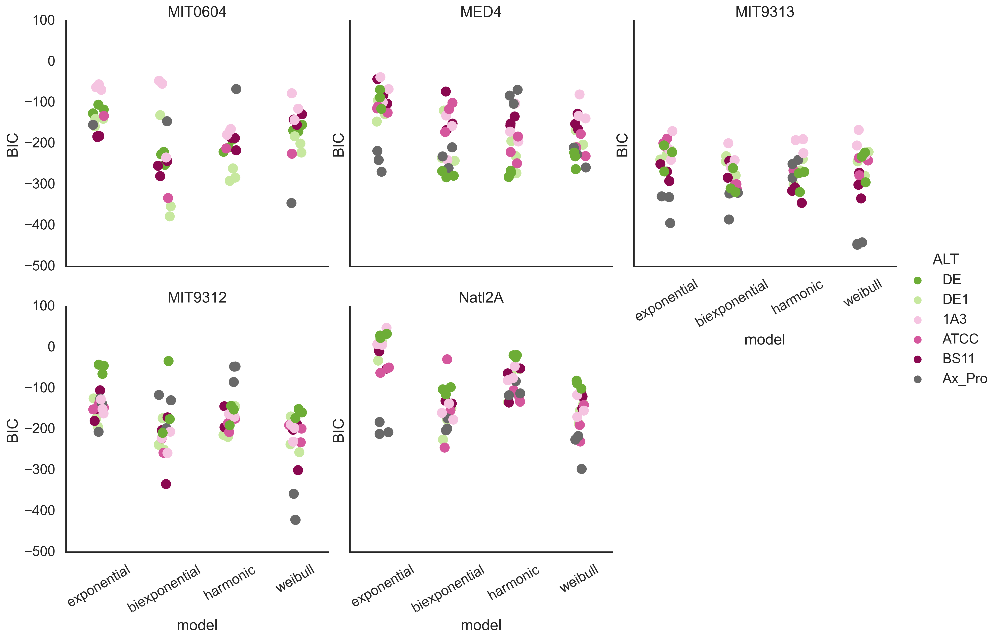

In [19]:
sns.set_context('talk')
sns.catplot(
    data=mdf.loc[mdf.experiment.isin(['e1']) & mdf.metric.isin(['bic'])],
    col='PRO', hue='ALT', x='model', col_wrap=3,
    row_order=porder, 
    hue_order=aorder + ['Ax_Pro'], palette=apallete + ['dimGrey'],
    y='value', edgecolor='white', s=12,
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='BIC')
#plt.xlabel 

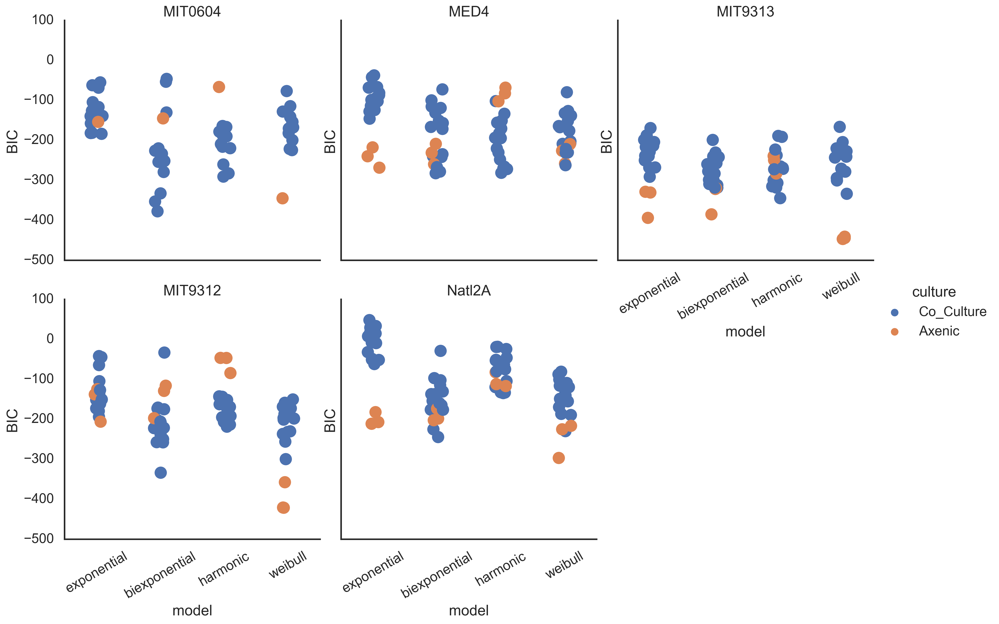

In [20]:
sns.set_context('talk')
sns.catplot(
    data=mdf.loc[mdf.experiment.isin(['e1']) & mdf.metric.isin(['bic'])],
    col='PRO', hue='culture', x='model', col_wrap=3,
    row_order=porder, 
    #hue_order=aorder + ['Ax_Pro'], 
    #palette=[PRO],
    y='value', edgecolor='white', 
    s=15
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='BIC')


In [21]:
df.ALT.unique()

array(['DE', 'DE1', 'BS11', '1A3', 'ATCC', 'Ax_Pro'], dtype=object)

In [22]:
tdf = mdf.loc[mdf.metric.isin(['bic'])]

bestdf = tdf.loc[tdf.groupby('experiment_sample').value.idxmin()].reset_index(drop=True)

In [23]:
sns.catplot(data=bestdf, x='model', row='experiment', col='PRO',
            col_order=porder,
            kind='count', hue='culture')

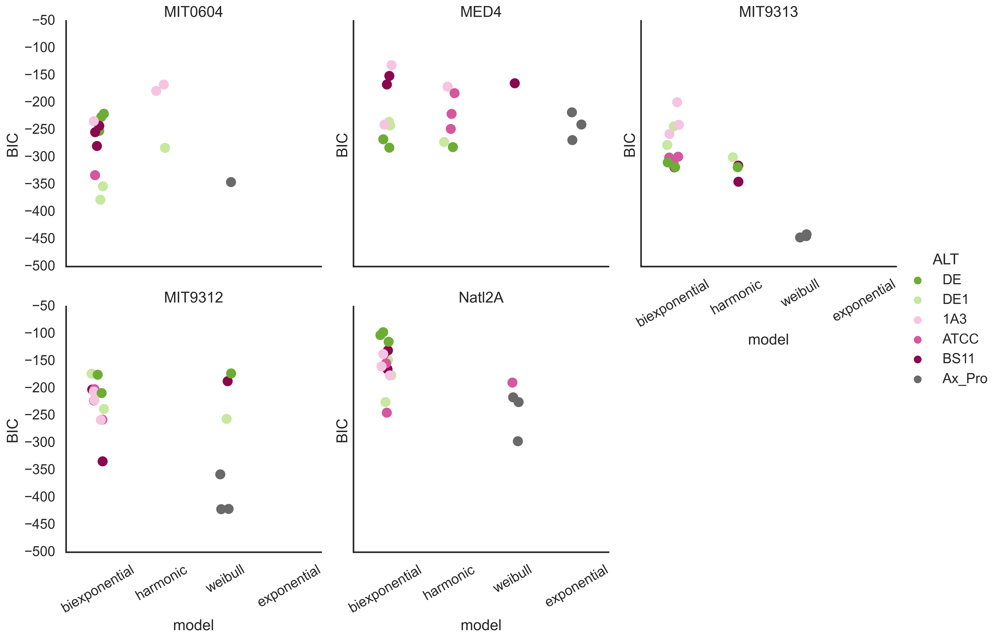

In [24]:
sns.set_context('talk')
sns.catplot(
    data=bestdf.loc[bestdf.experiment.isin(['e1']) & bestdf.metric.isin(['bic'])],
    col='PRO', hue='ALT', x='model', col_wrap=3,
    row_order=porder, 
    hue_order=aorder + ['Ax_Pro'], palette=apallete + ['dimGrey'],
    y='value', edgecolor='white', s=12,
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='BIC')


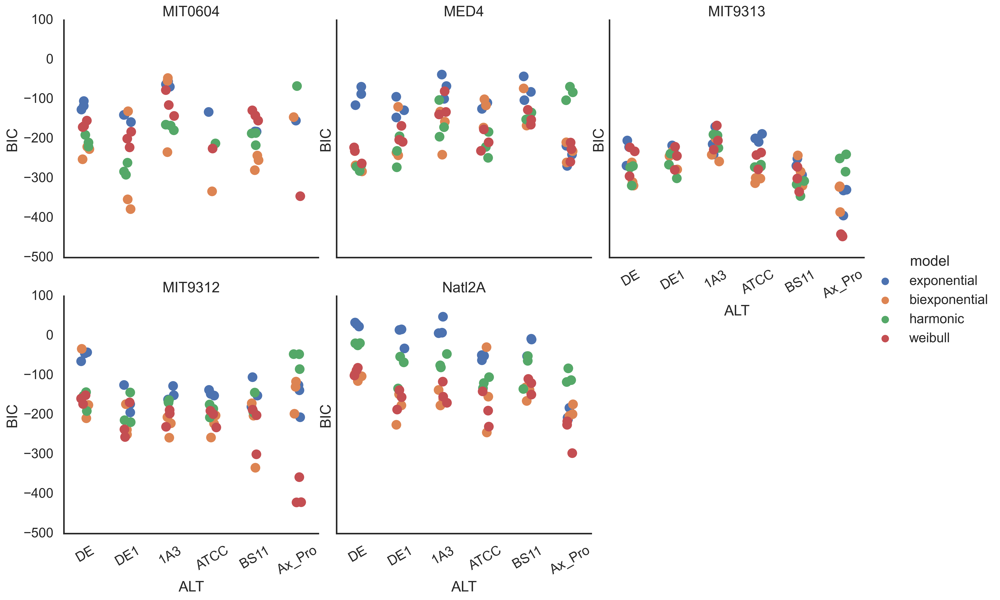

In [25]:
sns.set_context('talk')
sns.catplot(
    data=mdf.loc[mdf.experiment.isin(['e1']) & mdf.metric.isin(['bic'])],
    col='PRO', x='ALT', hue='model', col_wrap=3,
    row_order=porder, 
    order=aorder + ['Ax_Pro'], 
    #palette=apallete + ['dimGrey'],
    y='value', edgecolor='white', s=12,
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='BIC')


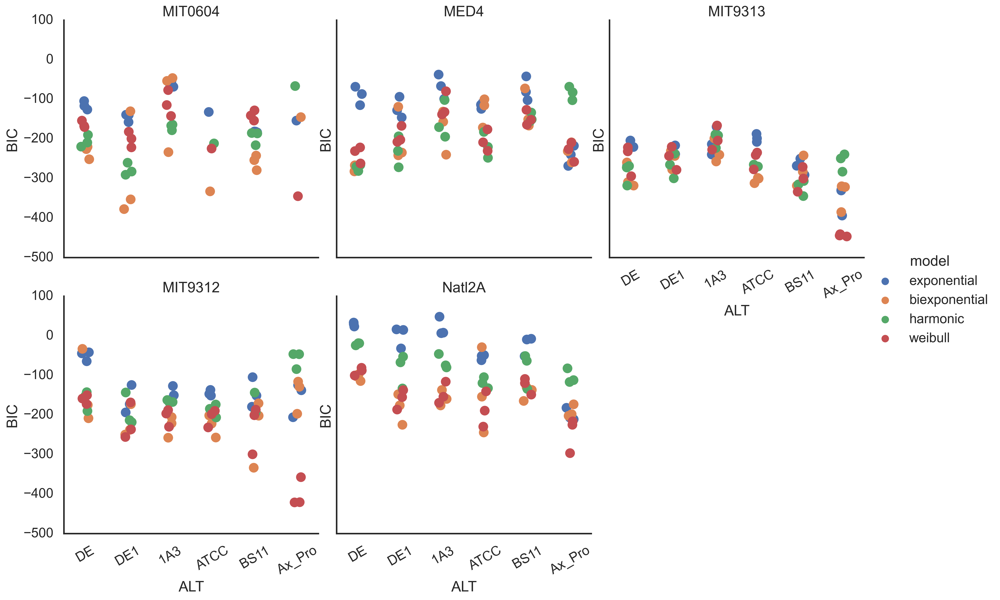

In [26]:
sns.set_context('talk')
sns.catplot(
    data=mdf.loc[mdf.experiment.isin(['e1']) & mdf.metric.isin(['bic'])],
    col='PRO', x='ALT', hue='model', col_wrap=3,
    row_order=porder, 
    order=aorder + ['Ax_Pro'], 
    #palette=apallete + ['dimGrey'],
    y='value', edgecolor='white', s=12,
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='BIC')


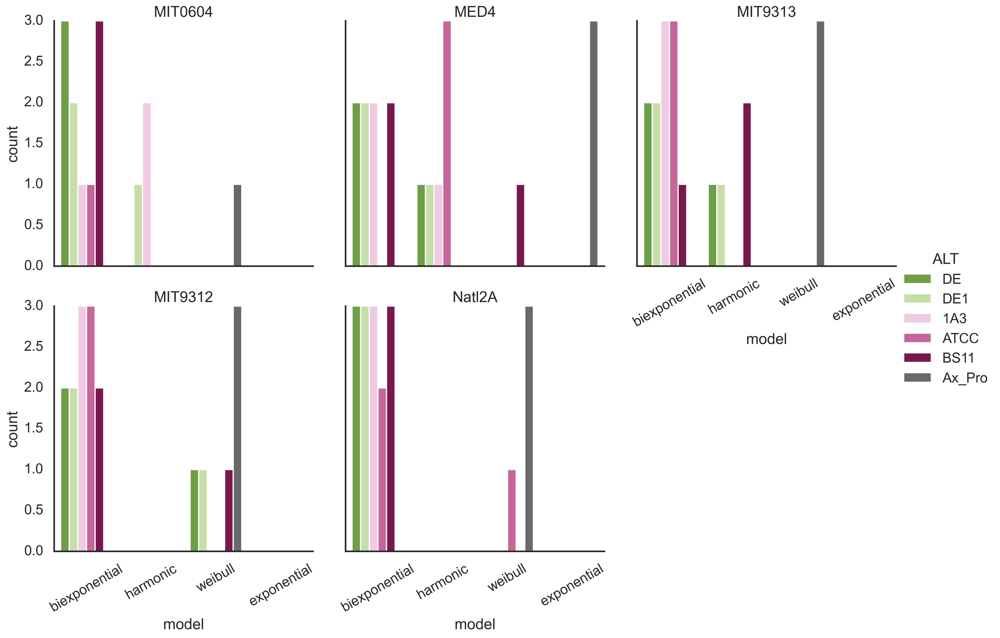

In [27]:
sns.set_context('talk')
sns.catplot(
    data=bestdf.loc[bestdf.experiment.isin(['e1']) & bestdf.metric.isin(['bic'])],
    col='PRO', hue='ALT', x='model', col_wrap=3,
    row_order=porder, 
    hue_order=aorder + ['Ax_Pro'], palette=apallete + ['dimGrey'],
     edgecolor='white', 
    kind='count'
    
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    )


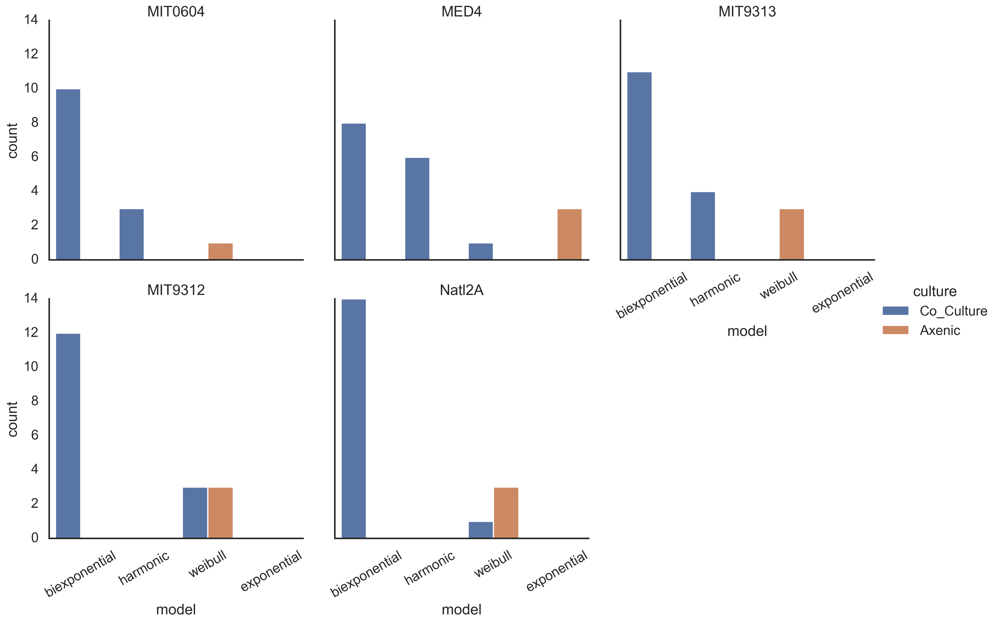

In [28]:
sns.set_context('talk')
sns.catplot(
    data=bestdf.loc[bestdf.experiment.isin(['e1']) & bestdf.metric.isin(['bic'])],
    col='PRO', hue='culture', x='model', col_wrap=3,
    row_order=porder, 
    #hue_order=aorder + ['Ax_Pro'], palette=apallete + ['dimGrey'],
     edgecolor='white', 
    kind='count'
    
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    )


In [29]:
df.columns

Index(['Unnamed: 0', 'experiment_sample', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'exponential_popt_0', 'exponential_popt_1',
       'exponential_popt_2', 'rmse_exponential', 'bic_exponential',
       'aic_exponential', 'biexponential_popt_0', 'biexponential_popt_1',
       'biexponential_popt_2', 'rmse_biexponential', 'bic_biexponential',
       'aic_biexponential', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2', 'rmse_harmonic', 'bic_harmonic', 'aic_harmonic',
       'weibull_popt_0', 'weibull_popt_1', 'weibull_popt_2', 'rmse_weibull',
       'bic_weibull', 'aic_weibull', 'f', 'a1', 'a2', 'weibull_n', 'weibull_a',
       'weibull_td', 'weibull_td2', 'p', 'PRO2', 'PA'],
      dtype='object')

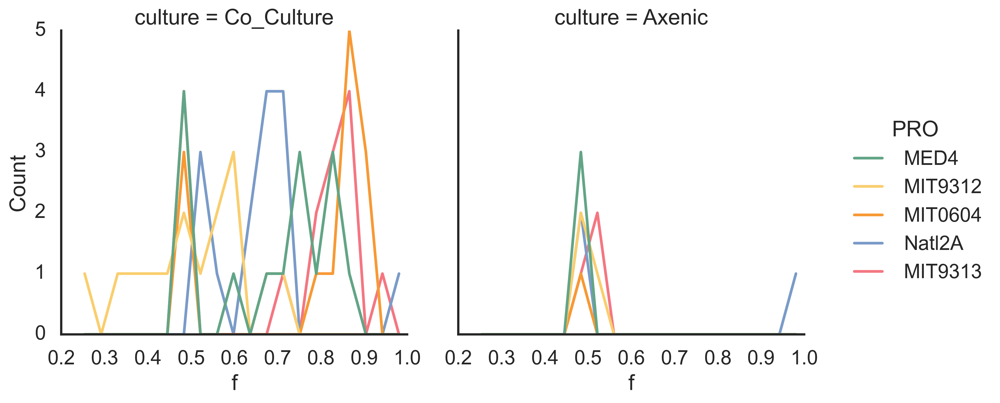

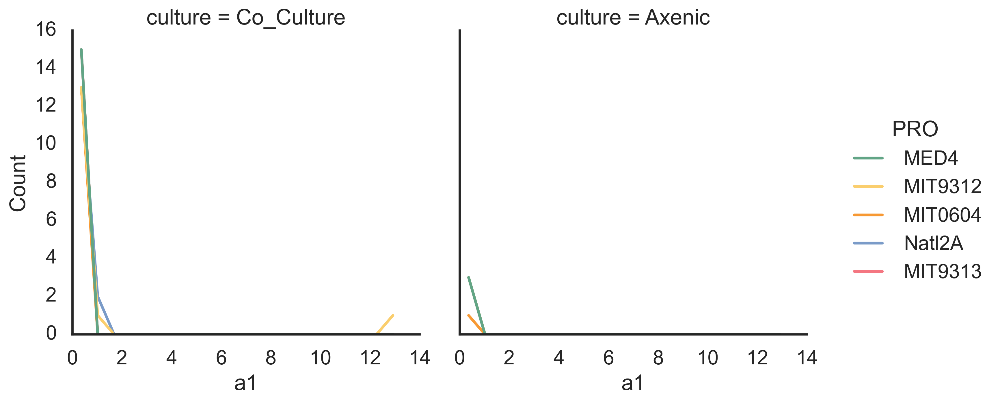

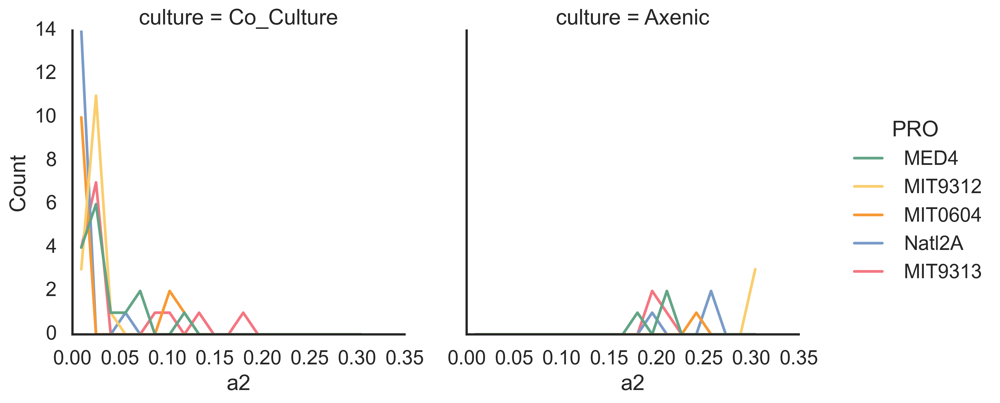

In [30]:
for c in ['f', 'a1', 'a2']:
    sns.displot(data=df.loc[df.experiment.isin(['e1'])], 
            x=c, 
            hue='PRO', hue_order=porder, palette=ppallete,
            bins=20, fill=False, element='poly',
            col='culture')

In [31]:
df.columns

Index(['Unnamed: 0', 'experiment_sample', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'exponential_popt_0', 'exponential_popt_1',
       'exponential_popt_2', 'rmse_exponential', 'bic_exponential',
       'aic_exponential', 'biexponential_popt_0', 'biexponential_popt_1',
       'biexponential_popt_2', 'rmse_biexponential', 'bic_biexponential',
       'aic_biexponential', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2', 'rmse_harmonic', 'bic_harmonic', 'aic_harmonic',
       'weibull_popt_0', 'weibull_popt_1', 'weibull_popt_2', 'rmse_weibull',
       'bic_weibull', 'aic_weibull', 'f', 'a1', 'a2', 'weibull_n', 'weibull_a',
       'weibull_td', 'weibull_td2', 'p', 'PRO2', 'PA'],
      dtype='object')

In [32]:
t = df['biexponential_popt_0'] > df['biexponential_popt_1']
df.loc[t, 'biexp_a1'] = df.loc[t, 'biexponential_popt_0']
df.loc[t, 'biexp_a2'] = df.loc[t, 'biexponential_popt_1']
df.loc[t, 'biexp_f'] = df.loc[t, 'biexponential_popt_2']
df.loc[~t, 'biexp_a1'] = df.loc[~t, 'biexponential_popt_1']
df.loc[~t, 'biexp_a2'] = df.loc[t, 'biexponential_popt_0']
df.loc[~t, 'biexp_f'] = 1 - df.loc[t, 'biexponential_popt_2']

In [33]:
t = df['biexponential_popt_2'] > 0.5
df.loc[t, 'biexp_a1'] = df.loc[t, 'biexponential_popt_0']
df.loc[t, 'biexp_a2'] = df.loc[t, 'biexponential_popt_1']
df.loc[t, 'biexp_f'] = df.loc[t, 'biexponential_popt_2']
df.loc[~t, 'biexp_a1'] = df.loc[~t, 'biexponential_popt_1']
df.loc[~t, 'biexp_a2'] = df.loc[t, 'biexponential_popt_0']
df.loc[~t, 'biexp_f'] = 1 - df.loc[t, 'biexponential_popt_2']

<AxesSubplot:xlabel='biexp_a1', ylabel='biexp_a2'>

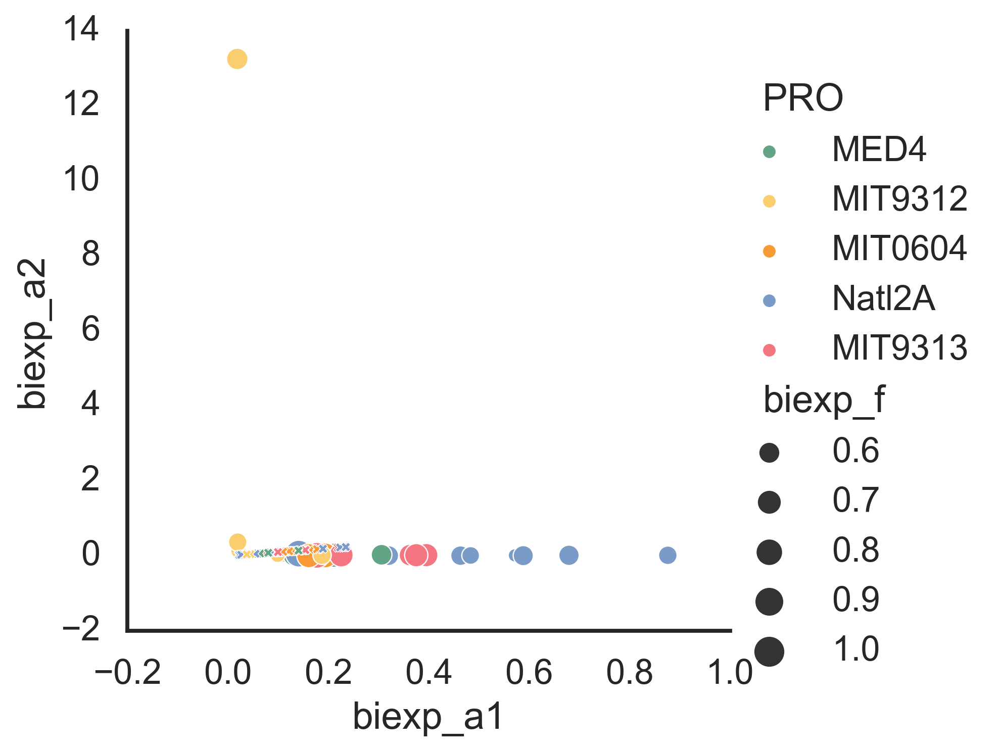

In [34]:
ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) & df.culture.isin(['Co_Culture'])], 
            x='biexp_a1', y= 'biexp_a2', #size='rmse_biexponential', style='culture',
                 size='biexp_f',
            hue='PRO', hue_order=porder, palette=ppallete,
            #col='culture',
            #sharey=False,
           )
sns.scatterplot(data=df.loc[df.experiment.isin(['e1']) & df.culture.isin(['Co_Culture'])], 
            x='exponential_popt_0', y= 'exponential_popt_0', markers=['X'], style='culture', legend=False,
            hue='PRO', hue_order=porder, palette=ppallete,
            #col='culture',
            #sharey=False,
           )
#plt.ylim((-0.1,2))


C:\Users\wosnat\Anaconda3\lib\site-packages\seaborn\relational.py:644: UserWarning: You passed a edgecolor/edgecolors ('w') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  points = ax.scatter(*args, **kws)


<AxesSubplot:xlabel='biexp_a1', ylabel='biexp_a2'>

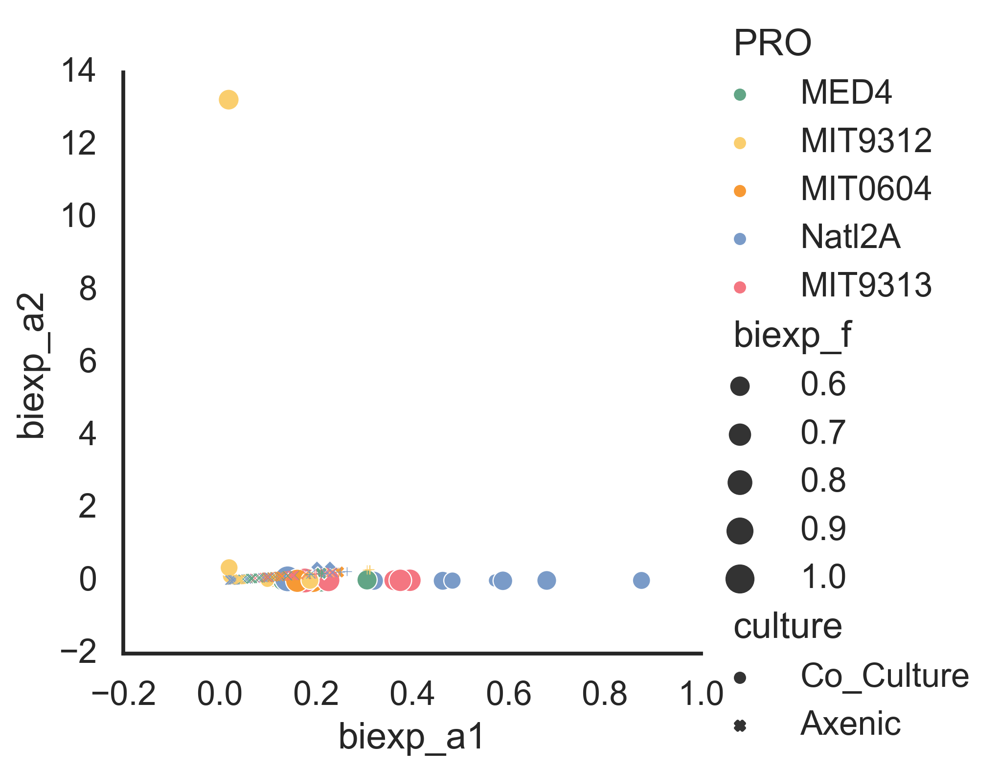

In [35]:
ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) ], 
            x='biexp_a1', y= 'biexp_a2', #size='rmse_biexponential', 
                 style='culture',
                 size='biexp_f',
            hue='PRO', hue_order=porder, palette=ppallete,
            #col='culture',
            #sharey=False,
           )
sns.scatterplot(data=df.loc[df.experiment.isin(['e1']) ], 
            x='exponential_popt_0', y= 'exponential_popt_0', markers=['x', '+'], style='culture', legend=False,
            hue='PRO', hue_order=porder, palette=ppallete,
            #col='culture',
            #sharey=False,
           )
#plt.ylim((-0.1,0.6))


In [36]:
df.loc[df.experiment.isin(['e1'])].groupby('culture')[['biexp_a1', 'biexp_a2', 'biexp_f',]].describe().T

culture            Axenic  Co_Culture
biexp_a1 count  13.000000   73.000000
         mean    0.239925    0.264555
         std     0.045482    0.208364
         min     0.186773    0.012370
         25%     0.209512    0.118091
         50%     0.215409    0.193418
         75%     0.264574    0.369158
         max     0.311974    0.942317
biexp_a2 count   3.000000   34.000000
         mean    0.219056    0.419629
         std     0.024541    2.268242
         min     0.200074    0.003545
         25%     0.205199    0.012023
         50%     0.210324    0.016215
         75%     0.228546    0.021441
         max     0.246769   13.251643
biexp_f  count   3.000000   34.000000
         mean    0.666687    0.745514
         std     0.288657    0.128522
         min     0.500000    0.508662
         25%     0.500031    0.656976
         50%     0.500061    0.751667
         75%     0.750030    0.847544
         max     1.000000    1.000000

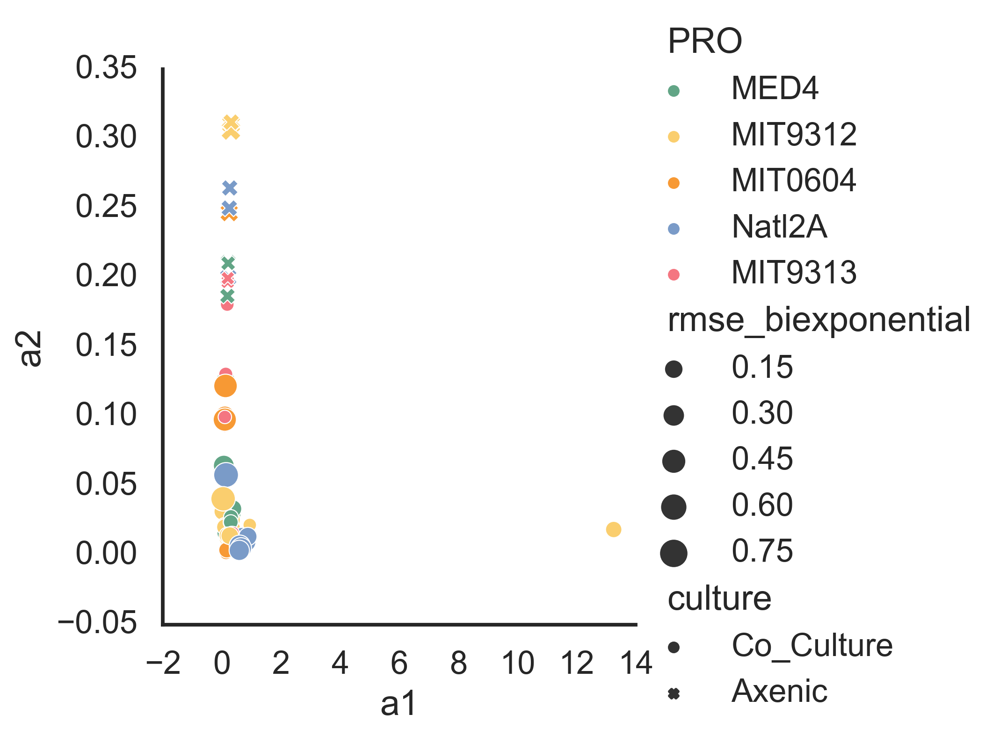

In [37]:
sns.relplot(data=df.loc[df.experiment.isin(['e1'])# & df.culture.isin(['Co_Culture'])
                       ], 
            x='a1', y= 'a2', size='rmse_biexponential', style='culture',
            hue='PRO', hue_order=porder, palette=ppallete,
            #col='culture',
            #sharey=False,
           )
#plt.xlim((-0.1,2))

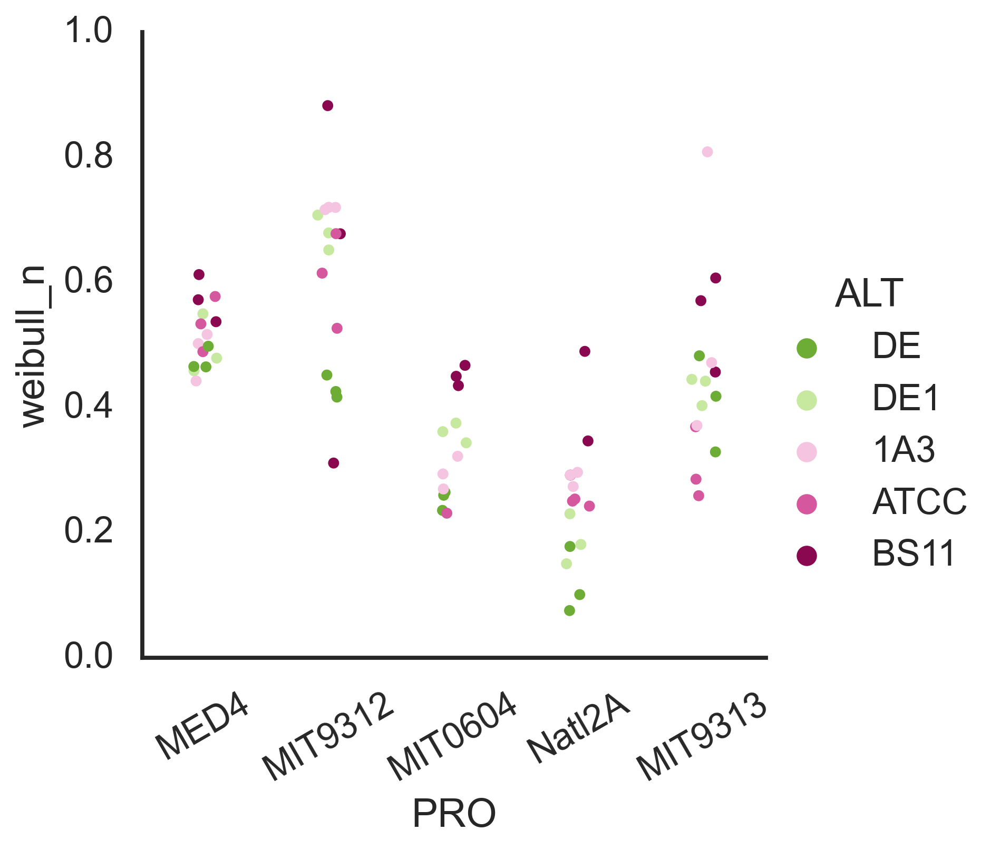

In [38]:
sns.set_context('talk')
sns.catplot(
    data=mdf.loc[mdf.experiment.isin(['e1']) & mdf.variable.isin(['weibull_n'])],
    x='PRO', hue='ALT', 
    order=porder, 
    hue_order=aorder, #+ ['Ax_Pro'], 
    palette=apallete, #+ ['dimGrey'],
    y='value', edgecolor='white', #s=12,
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='weibull_n')


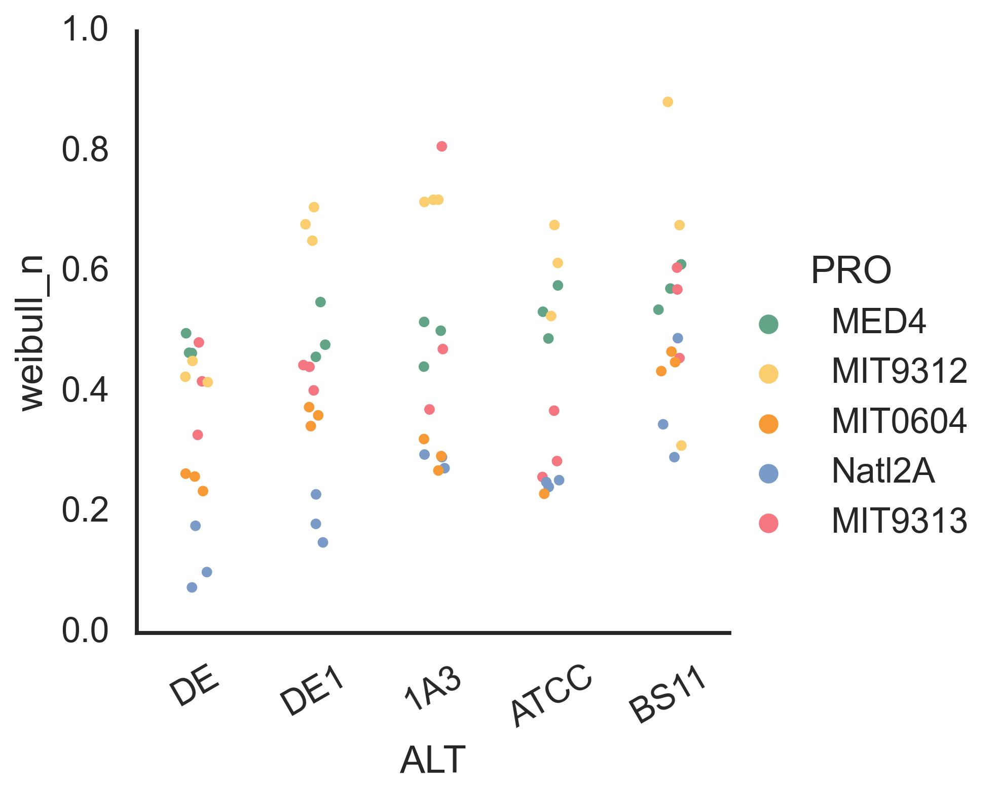

In [39]:
sns.set_context('talk')
sns.catplot(
    data=mdf.loc[mdf.experiment.isin(['e1']) & mdf.variable.isin(['weibull_n'])],
    hue='PRO', x='ALT', 
    hue_order=porder, 
    order=aorder, #+ ['Ax_Pro'], 
    palette=ppallete, #+ ['dimGrey'],
    y='value', edgecolor='white', #s=12,
           ).set_xticklabels(rotation=30).set_titles(col_template="{col_name}", row_template="{row_name}"
                                                    ).set(ylabel='weibull_n')


In [40]:
capdf = pd.read_csv('capacity.csv.gz')

In [41]:
capdf.head()

,Unnamed: 0,PRO,ALT,sample,PRO.1,ALT.1,experiment,day,culture,pair,...,N[ALT] max,C[Total] min,C[Total] max,N[Total] min,N[Total] max,percent_N,percent_PRO,ALT_percent_increase,totalN,ALTN
0,0,MED4,1A3,1A,7.485642e+06,2.992351e+07,exp1,100,Co_Culture,"MED4,1A3",...,53.434840,150.247707,250.629251,29.657527,58.781727,0.214023,0.063101,27.756630,29.657527,27.786117
1,1,MED4,1A3,1B,6.720907e+06,2.159764e+07,exp1,100,Co_Culture,"MED4,1A3",...,38.567219,110.310283,186.386490,21.735180,43.367866,0.156852,0.077304,20.014100,21.735180,20.054954
2,2,MED4,1A3,1C,1.121335e+07,1.742056e+07,exp1,100,Co_Culture,"MED4,1A3",...,31.108149,97.181541,174.473089,18.979575,39.117684,0.136966,0.147703,16.125588,18.979575,16.176237
3,3,MIT9313,1A3,2A,1.415617e+06,5.134250e+06,exp1,100,Co_Culture,"MIT9313,1A3",...,9.168304,27.970749,49.447977,5.475327,11.190614,0.039513,0.129272,4.595663,5.475327,4.767518
4,4,MIT9313,1A3,2B,1.018640e+06,4.885134e+06,exp1,100,Co_Culture,"MIT9313,1A3",...,8.723454,25.683439,44.312983,5.045516,10.178654,0.036411,0.100945,4.355577,5.045516,4.536196


In [42]:
capdf.columns

Index(['Unnamed: 0', 'PRO', 'ALT', 'sample', 'PRO.1', 'ALT.1', 'experiment',
       'day', 'culture', 'pair', 'C[PRO] min', 'C[PRO] max', 'N[PRO] min',
       'N[PRO] max', 'C[ALT] min', 'C[ALT] max', 'N[ALT] min', 'N[ALT] max',
       'C[Total] min', 'C[Total] max', 'N[Total] min', 'N[Total] max',
       'percent_N', 'percent_PRO', 'ALT_percent_increase', 'totalN', 'ALTN'],
      dtype='object')

In [43]:
idf = pd.read_excel( 'interaction_status_on_day_60.xlsx',)
idf = idf.drop(columns=['Unnamed: 6'])
idf = idf.melt(id_vars ='ALT', var_name='PRO', value_name='interaction')

In [44]:
idf.head()

,ALT,PRO,interaction
0,DE,MED4,0
1,DE1,MED4,+
2,1A3,MED4,+
3,ATCC,MED4,+
4,BS11,MED4,0


In [45]:
capdf['experiment_sample'] = capdf['experiment'] + ', ' + capdf['sample']
capdf['experiment_sample'] = capdf['experiment_sample'].str.replace('exp', 'e')

In [46]:
df = df.merge(capdf, on='experiment_sample',suffixes=('', '_cap'),)

In [47]:
df = df.merge(idf, on=['PRO', 'ALT'], suffixes=('', '_i'), )

In [48]:
df.columns

Index(['Unnamed: 0', 'experiment_sample', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'exponential_popt_0', 'exponential_popt_1',
       'exponential_popt_2', 'rmse_exponential', 'bic_exponential',
       'aic_exponential', 'biexponential_popt_0', 'biexponential_popt_1',
       'biexponential_popt_2', 'rmse_biexponential', 'bic_biexponential',
       'aic_biexponential', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2', 'rmse_harmonic', 'bic_harmonic', 'aic_harmonic',
       'weibull_popt_0', 'weibull_popt_1', 'weibull_popt_2', 'rmse_weibull',
       'bic_weibull', 'aic_weibull', 'f', 'a1', 'a2', 'weibull_n', 'weibull_a',
       'weibull_td', 'weibull_td2', 'p', 'PRO2', 'PA', 'biexp_a1', 'biexp_a2',
       'biexp_f', 'Unnamed: 0_cap', 'PRO_cap', 'ALT_cap', 'sample_cap',
       'PRO.1', 'ALT.1', 'experiment_cap', 'day', 'culture_cap', 'pair',
       'C[PRO] min', 'C[PRO] max', 'N[PRO] min', 'N[PRO] max', 'C[ALT] min',
       'C[ALT] max', 'N[ALT] min', 'N[ALT] 

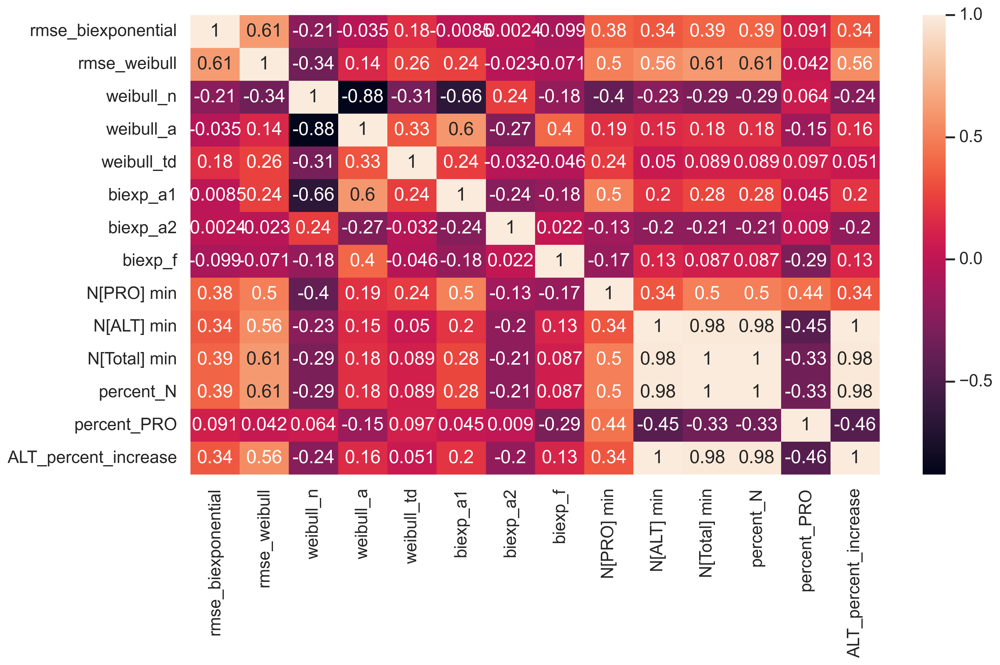

In [67]:
corr_cols = [
    'rmse_biexponential',
        'rmse_weibull', 
       'weibull_n', 'weibull_a', 'weibull_td',
        'biexp_a1', 'biexp_a2', 'biexp_f',  'N[PRO] min',
        'N[ALT] min', 
        'N[Total] min', 
       'percent_N','percent_PRO', 'ALT_percent_increase',]
corrMatrix = df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & df.culture.isin(['Co_Culture']), corr_cols].corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

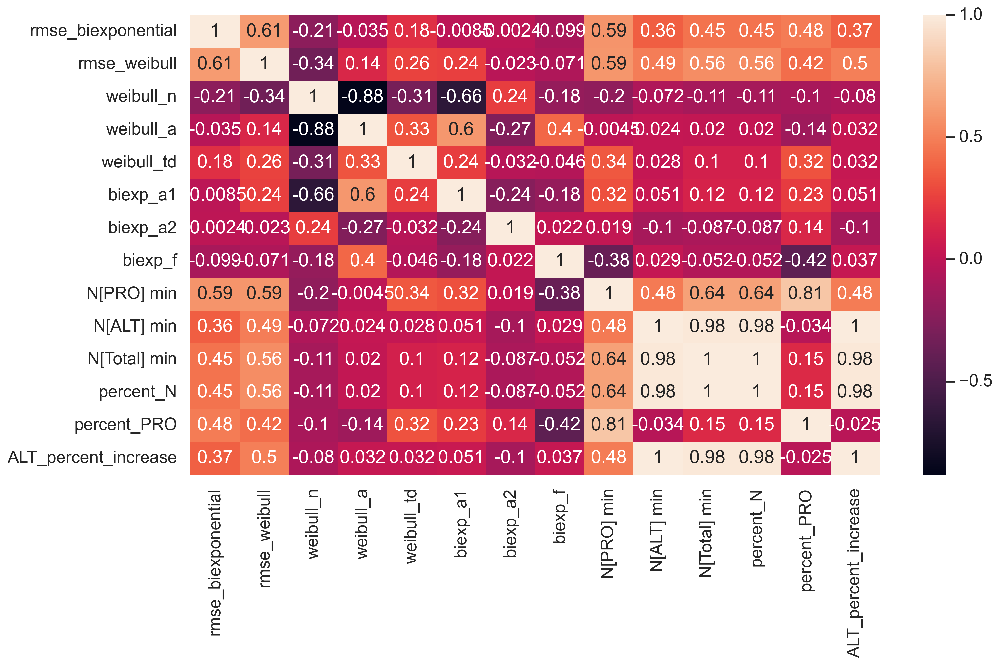

In [66]:
corr_cols = [
    'rmse_biexponential',
        'rmse_weibull', 
       'weibull_n', 'weibull_a', 'weibull_td',
        'biexp_a1', 'biexp_a2', 'biexp_f',  'N[PRO] min',
        'N[ALT] min', 
        'N[Total] min', 
       'percent_N','percent_PRO', 'ALT_percent_increase', ]
corrMatrix = df.loc[df.experiment.isin(['e1']) & df.day.isin(['100']) & df.culture.isin(['Co_Culture']), corr_cols].corr()
sns.heatmap(corrMatrix, annot=True)
plt.show()

In [51]:
df['1 - rsme']  = 1 - df.rmse_weibull

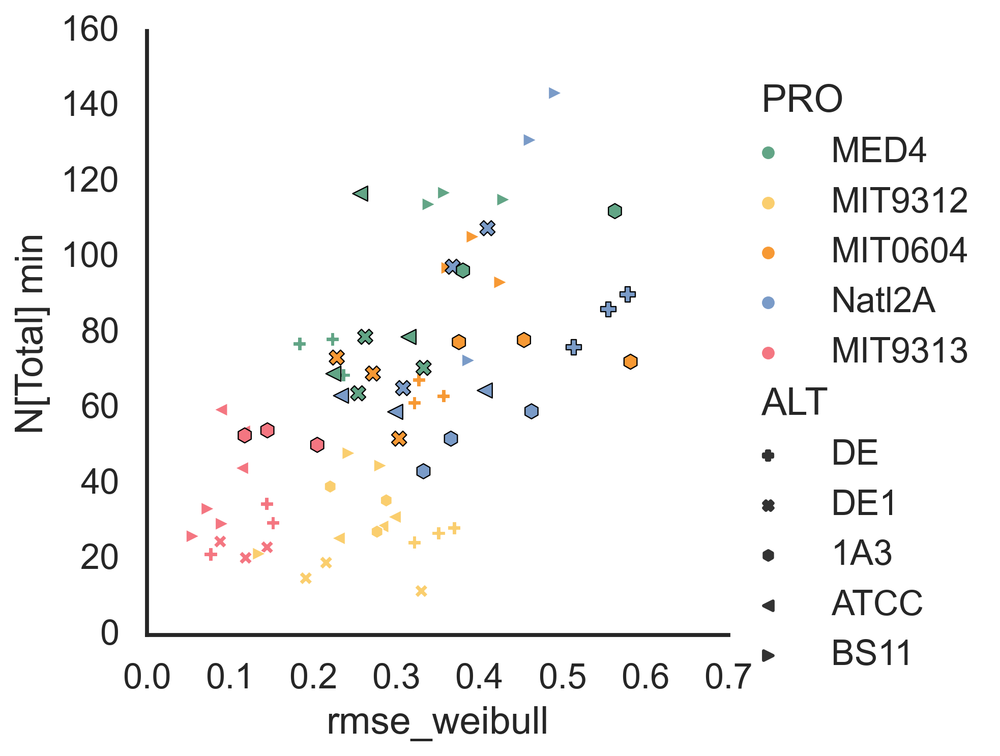

In [52]:
ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin([0])],
            x= 'rmse_weibull', y = 'N[Total] min', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            style='ALT',  style_order=aorder,markers=amarkers, s=40
           )
ax = sns.scatterplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin(['+'])],
            x= 'rmse_weibull', y = 'N[Total] min', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            style='ALT', style_order=aorder, markers=amarkers, 
                 s=50, edgecolor='black', ax=ax.axes.flat[0],
                     legend=False,
           )


Text(151.42790277777775, 0.5, 'Total Biomass [umol N/L]')

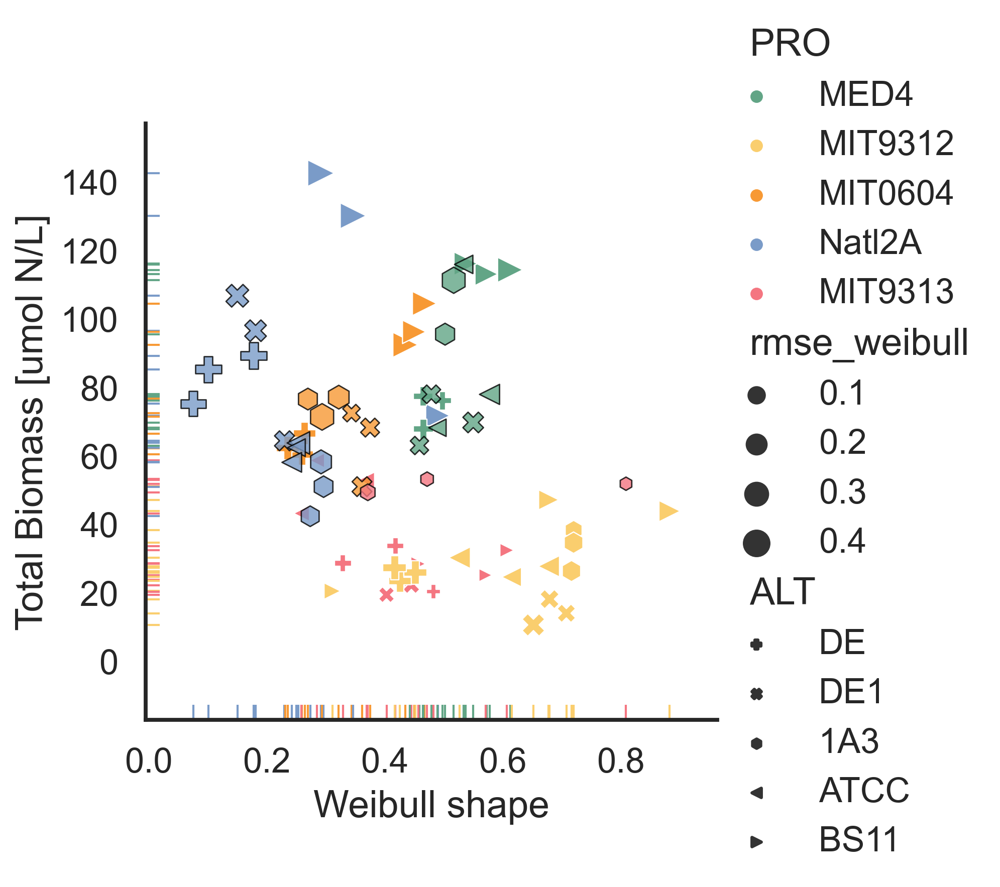

In [53]:
ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin([0])],
            x= 'weibull_n', y = 'N[Total] min', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            style='ALT',  style_order=aorder,markers=amarkers, #s=40,
                size='rmse_weibull',
                # size='1 - rsme',
           )
ax = sns.scatterplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin(['+'])],
            x= 'weibull_n', y = 'N[Total] min', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            style='ALT', style_order=aorder, markers=amarkers, 
                 #s=50,
                     edgecolor='black', ax=ax.axes.flat[0],
                size='rmse_weibull',
                 #size='1 - rsme',
                     legend=False, alpha=0.8,
           )
sns.rugplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) ],
            x= 'weibull_n', y = 'N[Total] min', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            legend=False,
           )
plt.xlabel('Weibull shape')
plt.ylabel('Total Biomass [umol N/L]')


<AxesSubplot:xlabel='weibull_n', ylabel='N[PRO] min'>

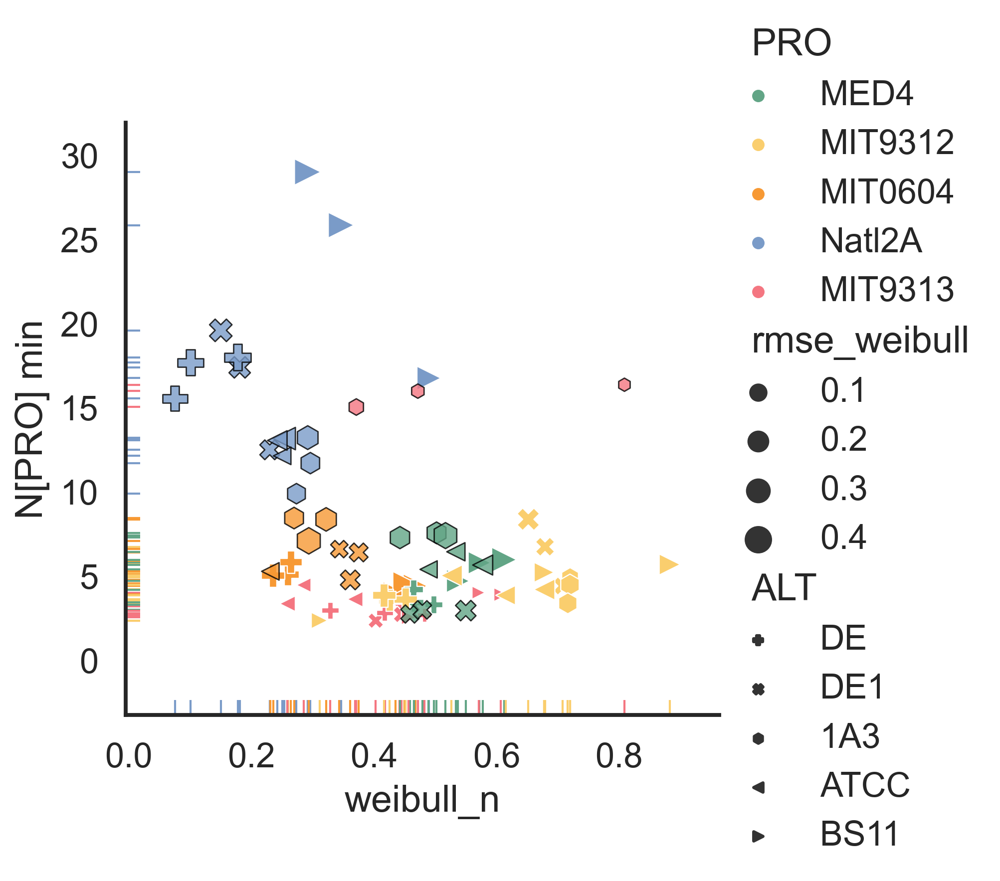

In [54]:
ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin([0])],
            x= 'weibull_n', y = 'N[PRO] min', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            style='ALT',  style_order=aorder,markers=amarkers, #s=40,
                size='rmse_weibull',
                # size='1 - rsme',
           )
ax = sns.scatterplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin(['+'])],
            x= 'weibull_n', y = 'N[PRO] min', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            style='ALT', style_order=aorder, markers=amarkers, 
                 #s=50,
                     edgecolor='black', ax=ax.axes.flat[0],
                size='rmse_weibull',
                 #size='1 - rsme',
                     legend=False, alpha=0.8,
           )
sns.rugplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) ],
            x= 'weibull_n', y = 'N[PRO] min', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            legend=False,
           )

Text(151.42790277777775, 0.5, 'Total Biomass [umol N/L]')

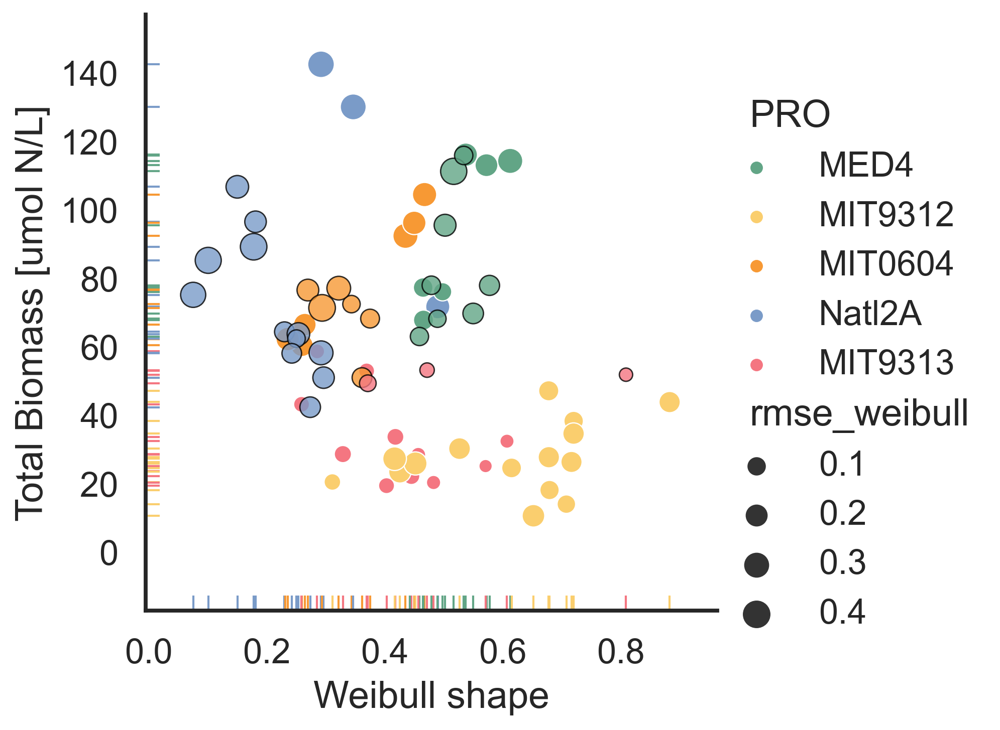

In [55]:
ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin([0])],
            x= 'weibull_n', y = 'N[Total] min', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            #style='ALT',  style_order=aorder,markers=amarkers, 
                # s=40,
                size='rmse_weibull',
                # size='1 - rsme',
           )
ax = sns.scatterplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin(['+'])],
            x= 'weibull_n', y = 'N[Total] min', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            #style='ALT', style_order=aorder, markers=amarkers, 
                 #s=50,
                     edgecolor='black', ax=ax.axes.flat[0],
                size='rmse_weibull',
                # size='1 - rsme',
                     legend=False, alpha=0.8,
           )
sns.rugplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) ],
            x= 'weibull_n', y = 'N[Total] min', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            legend=False,
           )
plt.xlabel('Weibull shape')
plt.ylabel('Total Biomass [umol N/L]')


Text(140.00135069444443, 0.5, '% PRO of biomass')

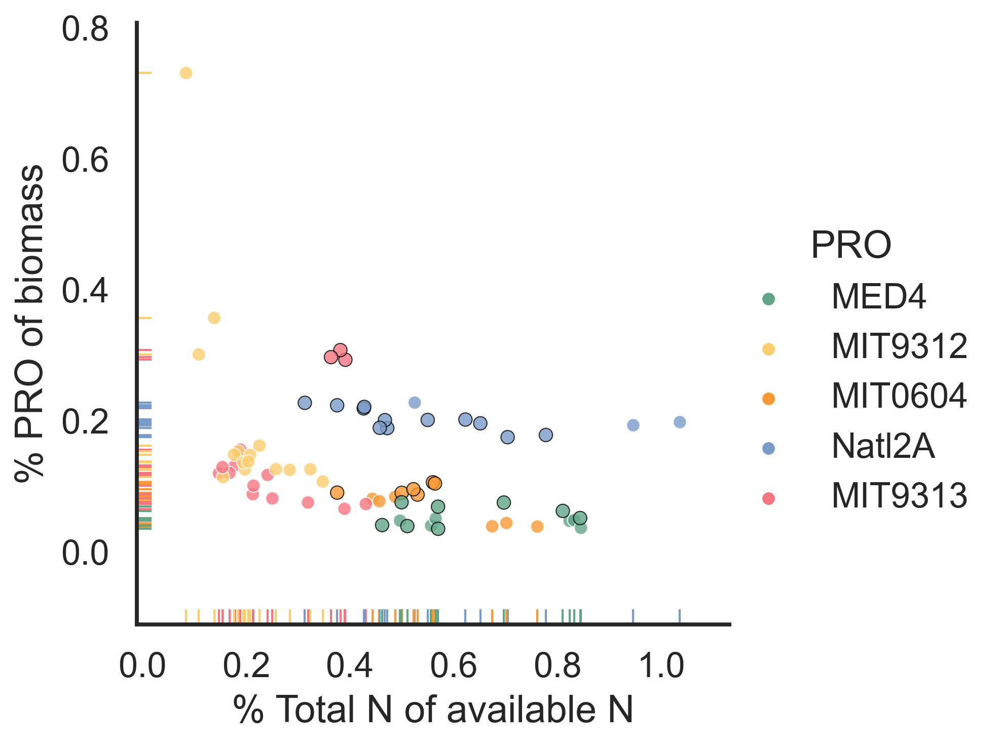

In [56]:
ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin([0])],
            x= 'percent_N', y = 'percent_PRO', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            #style='ALT',  style_order=aorder,markers=amarkers, 
                s=40,
                #size='rmse_weibull',
                # size='1 - rsme',
                     
                 alpha=0.8,
                 
           )
ax = sns.scatterplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin(['+'])],
            x= 'percent_N', y = 'percent_PRO', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            #style='ALT', style_order=aorder, markers=amarkers, 
                 s=40,
                     edgecolor='black', ax=ax.axes.flat[0],
                #size='rmse_weibull',
                # size='1 - rsme',
                     legend=False, alpha=0.8,
           )
sns.rugplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) ],
            x= 'percent_N', y = 'percent_PRO', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            legend=False,
           )
plt.xlabel('% Total N of available N')
plt.ylabel('% PRO of biomass')


Text(140.00135069444443, 0.5, '% PRO of biomass')

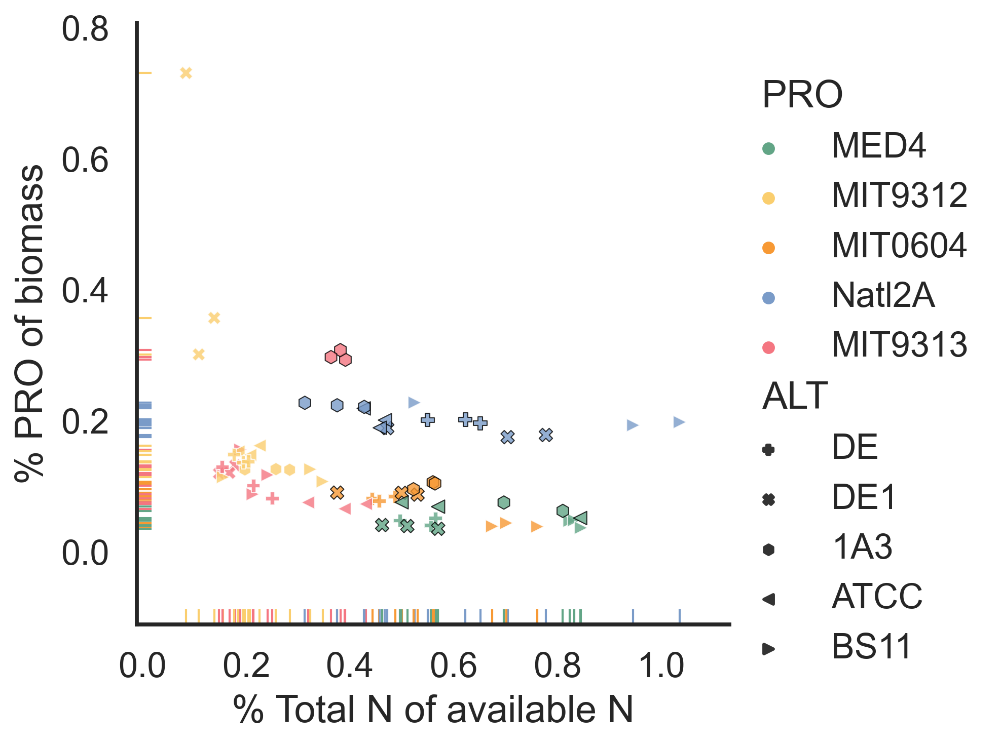

In [57]:
ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin([0])],
            x= 'percent_N', y = 'percent_PRO', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            style='ALT',  style_order=aorder,markers=amarkers, 
                s=40,
                #size='rmse_weibull',
                # size='1 - rsme',
                     
                 alpha=0.8,
                 
           )
ax = sns.scatterplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin(['+'])],
            x= 'percent_N', y = 'percent_PRO', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            style='ALT', style_order=aorder, markers=amarkers, 
                 s=40,
                     edgecolor='black', ax=ax.axes.flat[0],
                #size='rmse_weibull',
                # size='1 - rsme',
                     legend=False, alpha=0.8,
           )
sns.rugplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) ],
            x= 'percent_N', y = 'percent_PRO', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            legend=False,
           )
plt.xlabel('% Total N of available N')
plt.ylabel('% PRO of biomass')


In [63]:
df.day.unique()

array(['100', '140', '60', 'exp3_140', 'exp4_140'], dtype=object)

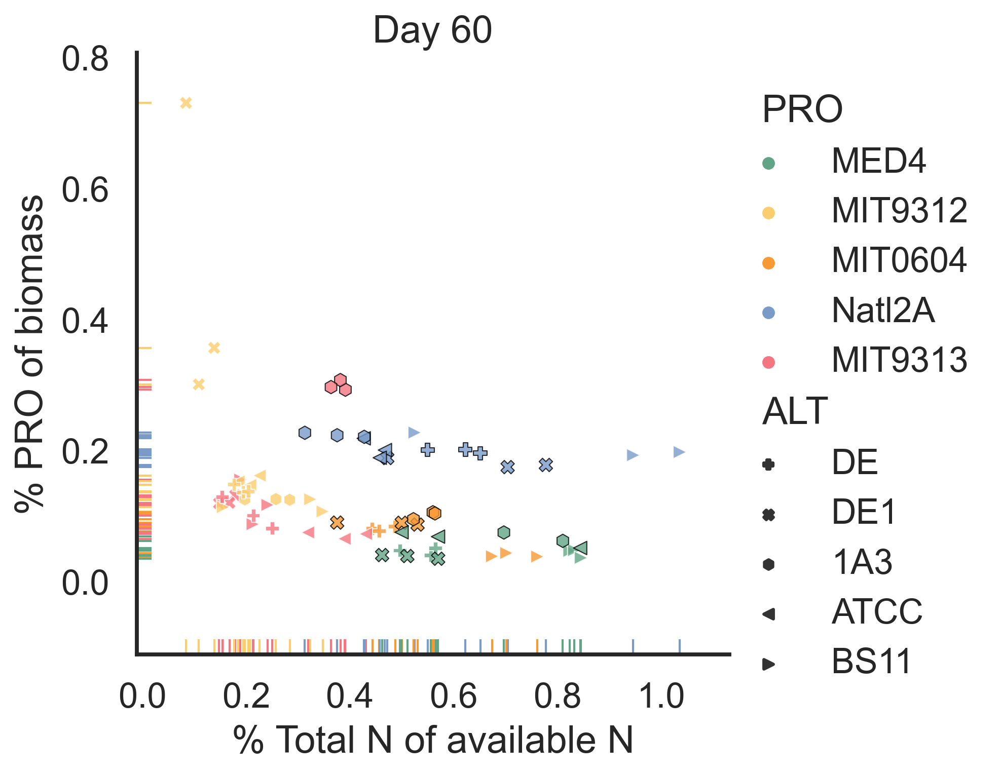

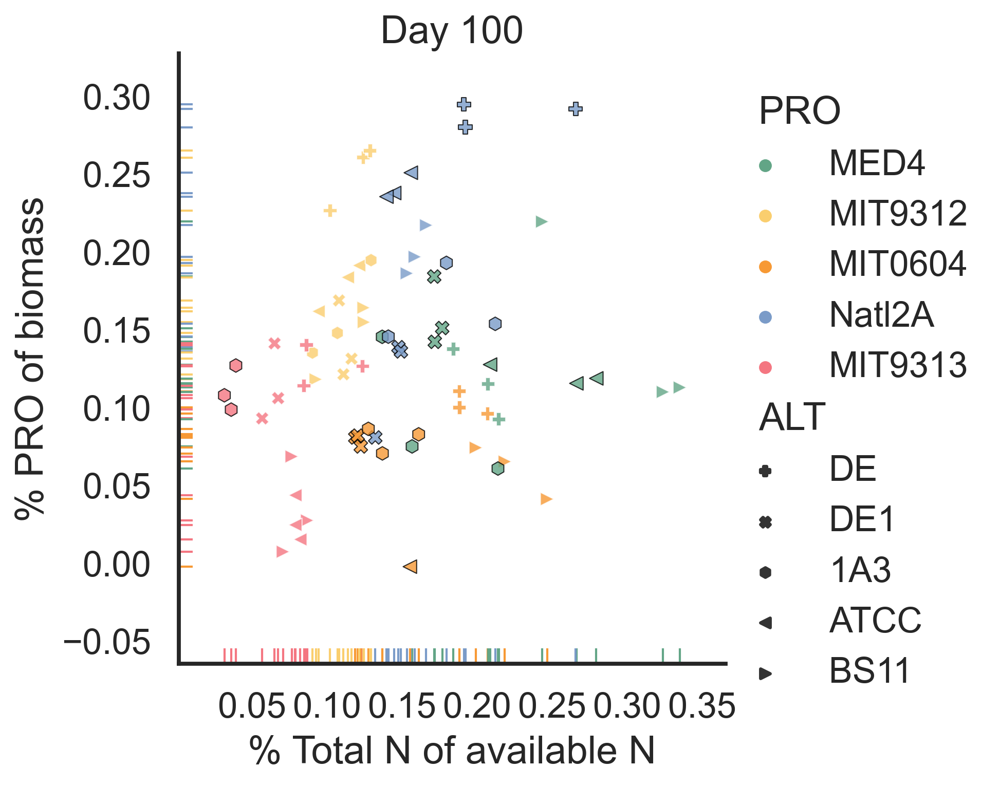

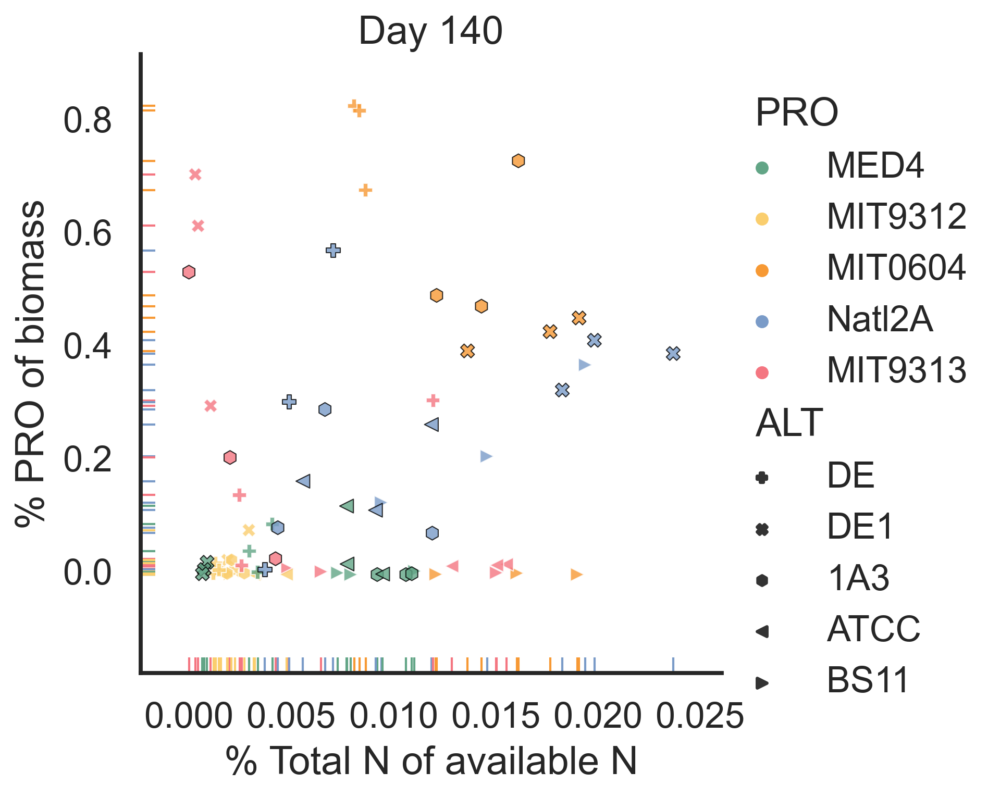

In [64]:
for d in ['60','100', '140']:
    ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin([d]) & 
                                 df.culture.isin(['Co_Culture']) & df.interaction.isin([0])],
                x= 'percent_N', y = 'percent_PRO', 
                hue='PRO', hue_order=porder, palette=ppallete, 
                style='ALT',  style_order=aorder,markers=amarkers, 
                    s=40,
                    #size='rmse_weibull',
                    # size='1 - rsme',

                     alpha=0.8,

               )
    ax = sns.scatterplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin([d]) & 
                                 df.culture.isin(['Co_Culture']) & df.interaction.isin(['+'])],
                x= 'percent_N', y = 'percent_PRO', 
                hue='PRO', hue_order=porder, palette=ppallete, 
                style='ALT', style_order=aorder, markers=amarkers, 
                     s=40,
                         edgecolor='black', ax=ax.axes.flat[0],
                    #size='rmse_weibull',
                    # size='1 - rsme',
                         legend=False, alpha=0.8,
               )
    sns.rugplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin([d]) & 
                                 df.culture.isin(['Co_Culture']) ],
                x= 'percent_N', y = 'percent_PRO', 
                hue='PRO', hue_order=porder, palette=ppallete, 
                legend=False,
               )
    plt.xlabel('% Total N of available N')
    plt.ylabel('% PRO of biomass')
    plt.title(f'Day {d}')


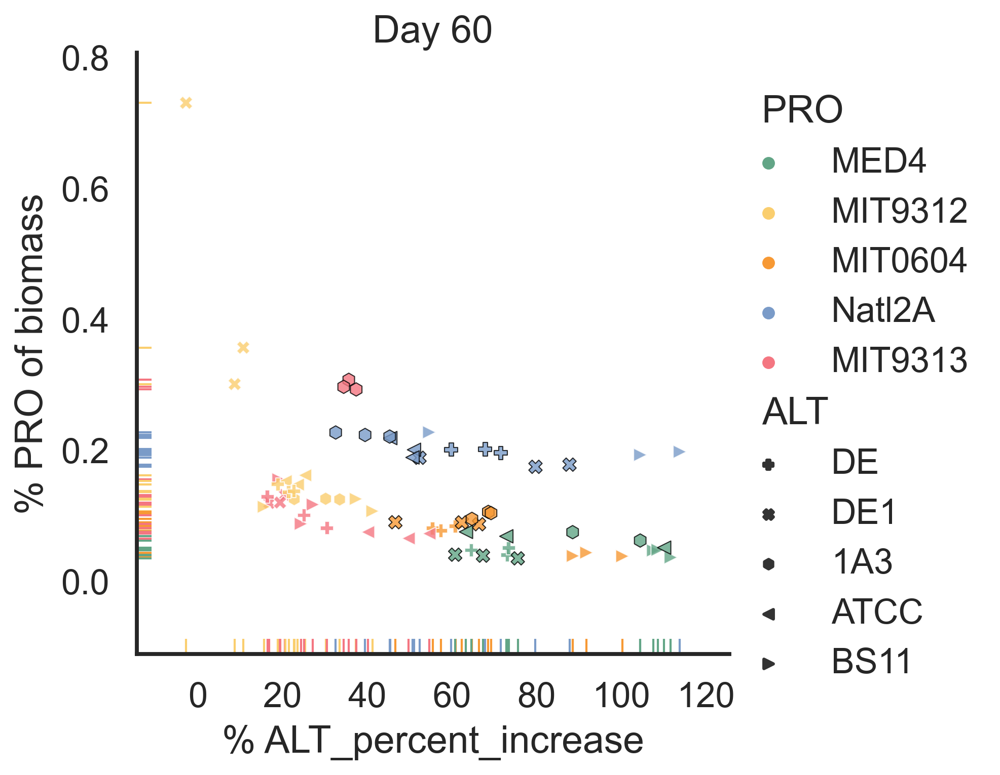

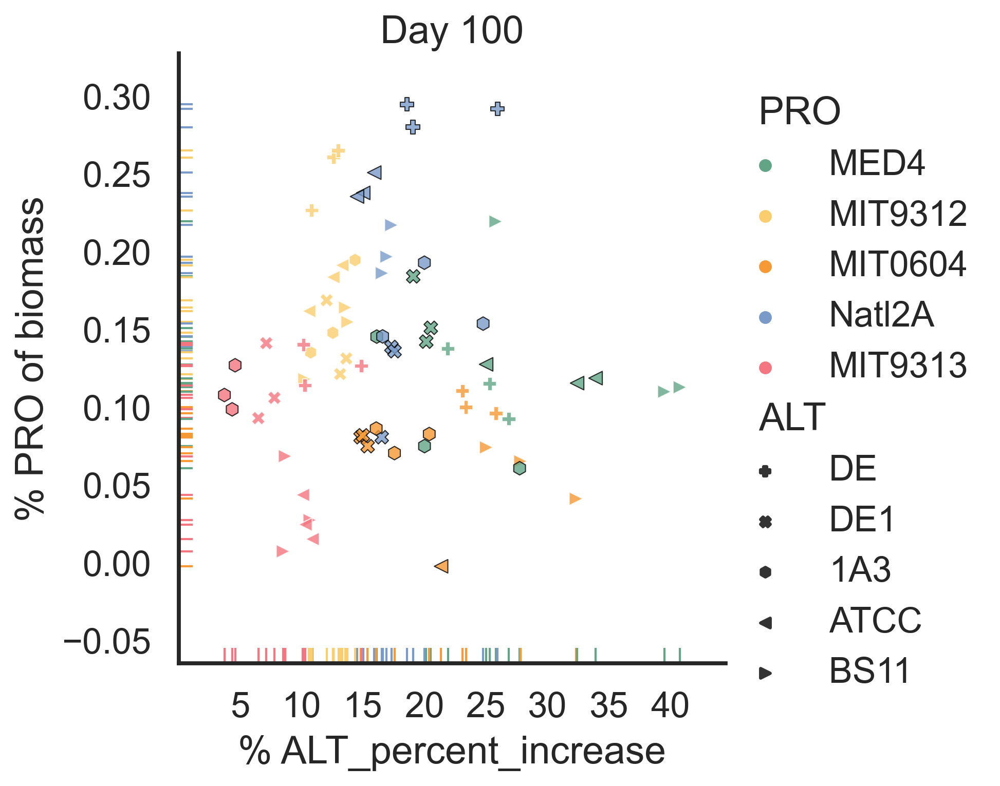

In [65]:
for d in ['60', '100']:
    ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin([d]) & 
                                 df.culture.isin(['Co_Culture']) & df.interaction.isin([0])],
                x= 'ALT_percent_increase', y = 'percent_PRO', 
                hue='PRO', hue_order=porder, palette=ppallete, 
                style='ALT',  style_order=aorder,markers=amarkers, 
                    s=40,
                    #size='rmse_weibull',
                    # size='1 - rsme',

                     alpha=0.8,

               )
    ax = sns.scatterplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin([d]) & 
                                 df.culture.isin(['Co_Culture']) & df.interaction.isin(['+'])],
                x= 'ALT_percent_increase', y = 'percent_PRO', 
                hue='PRO', hue_order=porder, palette=ppallete, 
                style='ALT', style_order=aorder, markers=amarkers, 
                     s=40,
                         edgecolor='black', ax=ax.axes.flat[0],
                    #size='rmse_weibull',
                    # size='1 - rsme',
                         legend=False, alpha=0.8,
               )
    sns.rugplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin([d]) & 
                                 df.culture.isin(['Co_Culture']) ],
                x= 'ALT_percent_increase', y = 'percent_PRO', 
                hue='PRO', hue_order=porder, palette=ppallete, 
                legend=False,
               )
    plt.xlabel('% ALT_percent_increase')
    plt.ylabel('% PRO of biomass')
    plt.title(f'Day {d}')


Text(144.44409027777775, 0.5, '% PRO of biomass')

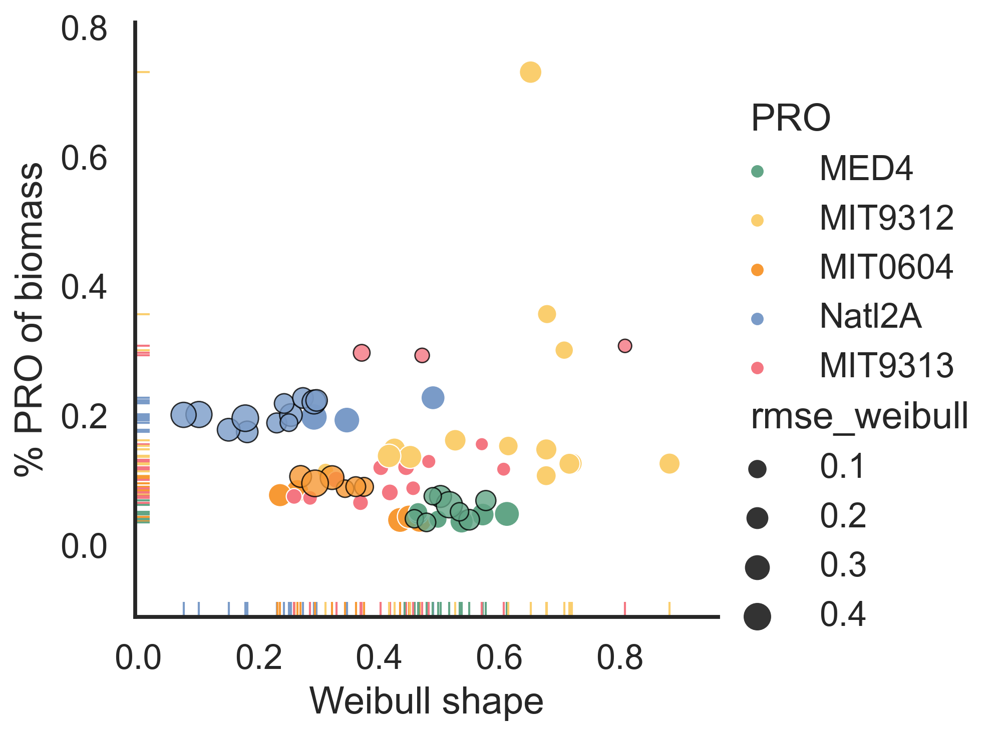

In [58]:
ax = sns.relplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin([0])],
            x= 'weibull_n', y = 'percent_PRO', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            #style='ALT',  style_order=aorder,markers=amarkers, 
                # s=40,
                size='rmse_weibull',
                # size='1 - rsme',
           )
ax = sns.scatterplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) & df.interaction.isin(['+'])],
            x= 'weibull_n', y = 'percent_PRO', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            #style='ALT', style_order=aorder, markers=amarkers, 
                 #s=50,
                     edgecolor='black', ax=ax.axes.flat[0],
                size='rmse_weibull',
                # size='1 - rsme',
                     legend=False, alpha=0.8,
           )
sns.rugplot(data=df.loc[df.experiment.isin(['e1']) & df.day.isin(['60']) & 
                             df.culture.isin(['Co_Culture']) ],
            x= 'weibull_n', y = 'percent_PRO', 
            hue='PRO', hue_order=porder, palette=ppallete, 
            legend=False,
           )
plt.xlabel('Weibull shape')
plt.ylabel('% PRO of biomass')
